# Задание 1 (10 баллов)

Придумайте 5 категорий и сгенерируйте по 6 картинок на каждую (всего 30) с помощью генеративной diffusion модели и попытайтесь восстановить изначальное разбиение на категории из эмбеддингов картинок с помощью модели CLIP и любого алгоритма кластеризации. Проанализируйте результаты.

- Категории могут быть абсолютно любыми, главное чтобы они были действительно (по вашему мнению) визуально отличимы друг от друга (примеры: `архитектура`, `собаки`, `машины`, `свитеры`)
- Можете использовать `segmind/SSD-1B` из семинара или какую-то другую модели с huggingface (например, `stabilityai/stable-diffusion-xl-base-1.0`, `stabilityai/stable-diffusion-2-1`).
- каждый промпт должен быть полностью уникальным; внутри одного промпта и из промпта в промпт могут повторяться только предлоги/частицы/артикли; минимальная длина промпта - 10 слов; сохраните все промпты, которые вы использовали
- помимо промпта вам также нужно использовать параметры `guidance_scale`, `negative_prompt`, `height`, `width` (в разных промптах значения должны быть разными)
- используйте `generator = torch.Generator('cuda').manual_seed(12363)` для фиксации random_seed и воспроизводимости (*само значение вы можете подбирать в каждом отдельном случае пока не получится хорошая картинка*)
- сгенерированные картинки не должны быть идеальными, но должны хоть как-то отражать промпт; если у вас получается совсем что-то непонятное, то попытайтесь еще раз с другим seed или остальными параметрами;
- для наглядности напечатайте все картинки, но используйте to_256 из семинара, чтобы не перегружать ноутбук
- можете использовать любую clip модель (например `clip-vit-base-patch32` из семинара) для создания эмбедингов картинок (промпты эмбеддить не нужно)
- можете использовать любой алгоритм кластеризации, но лучше использовать алгоритмы с указанием количества кластеров; в целом постарайтесь получить как можно более хороший результат (даже если кластеризация совсем неверная, должна прослеживаться какая-то логика, результат не должен быть случайным);
- оценивайте качество кластеризации с помощью метрики ARI; лучшую модель разберите визуально - опишите как минимум 3 паттерна (не обязательно корректных), которые модель смогла уловить, а также 3 паттерна (если они есть), которые модель не распознала.

Категории: лес, птицы, рыбы, горы, техника

## Генерируем картинки

In [ ]:
!pip install diffusers accelerate torchvision transformers

In [13]:
!pip install transformers --upgrade

Looking in indexes: https://pypi.org/simple, https://test.pypi.org/simple/


In [2]:
import torch
from diffusers import StableDiffusionXLImg2ImgPipeline, StableDiffusionXLPipeline
from diffusers.utils import load_image
from PIL import Image
from torchvision import transforms

/home/jovyan/akimov_de/venv/lib/python3.9/site-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/home/jovyan/akimov_de/venv/lib/python3.9/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
/home/jovyan/akimov_de/venv/lib/python3.9/site-packages/transformers/utils/generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [3]:
to_256 = transforms.Resize(256)

In [ ]:
pipe = StableDiffusionXLPipeline.from_pretrained("segmind/SSD-1B", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
_ = pipe.to("cuda")

### Forest

In [49]:
prompt = 'lively burge forest with a lake and a bautiful sunset'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(12363)

gen_image1 = pipe(prompt,
             generator=generator,
             height=768, # размер итоговой картинки
             width=1344, # размер итоговой картинки
             negative_prompt='dolden retriever runs in the forest',
             guidance_scale=9.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

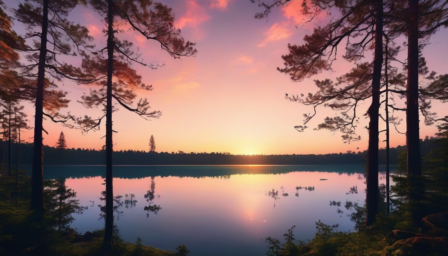

In [51]:
to_256(gen_image1)

  0%|          | 0/20 [00:00<?, ?it/s]

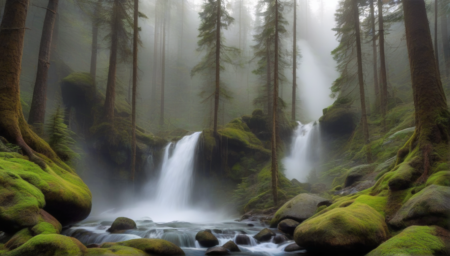

In [52]:
prompt = 'A dense, fog-covered forest with towering pine trees and a hidden waterfall cascading down mossy rocks'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(12364)

gen_image2 = pipe(prompt,
             generator=generator,
             height=760, # размер итоговой картинки
             width=1336, # размер итоговой картинки
             negative_prompt='No people, no animals, no urban elements, no clear skies, no bright sunlight',
             guidance_scale=8.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image2)

  0%|          | 0/20 [00:00<?, ?it/s]

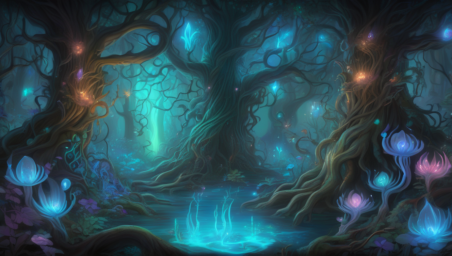

In [53]:
prompt = 'An enchanted forest with glowing, bioluminescent plants and mythical creatures lurking among ancient, twisted trees'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(12334)

gen_image3 = pipe(prompt,
             generator=generator,
             height=752, # размер итоговой картинки
             width=1328, # размер итоговой картинки
             negative_prompt='No modern technology, no vehicles, no plain or dull scenery, no daytime, no ordinary animals',
             guidance_scale=8.5, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image3)

  0%|          | 0/20 [00:00<?, ?it/s]

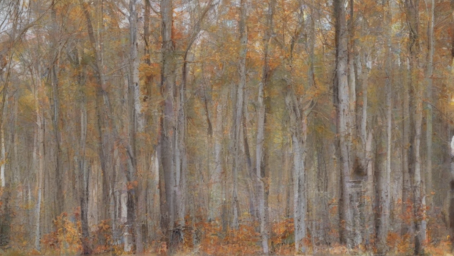

In [54]:
prompt = 'A serene autumn forest scene with vibrant orange and yellow leaves blanketing the ground beneath tall, slender birch trees.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(11334)

gen_image4 = pipe(prompt,
             generator=generator,
             height=744, # размер итоговой картинки
             width=1320, # размер итоговой картинки
             negative_prompt='A serene autumn forest scene with vibrant orange and yellow leaves blanketing the ground beneath tall, slender birch trees.',
             guidance_scale=7.5, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image4)

  0%|          | 0/20 [00:00<?, ?it/s]

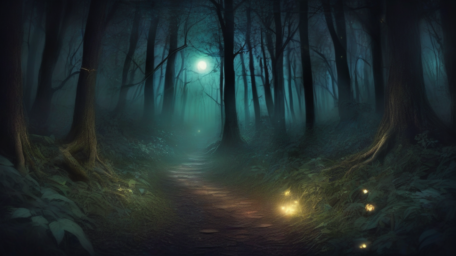

In [55]:
prompt = 'A mystical, moonlit forest at night with eerie shadows, sparkling fireflies, and a mysterious path leading deeper into the woods'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(11334)

gen_image5 = pipe(prompt,
             generator=generator,
             height=736, # размер итоговой картинки
             width=1312, # размер итоговой картинки
             negative_prompt='No daytime, no bright colors, no modern objects, no crowds, no clear paths',
             guidance_scale=7.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image5)

### Birds

  0%|          | 0/20 [00:00<?, ?it/s]

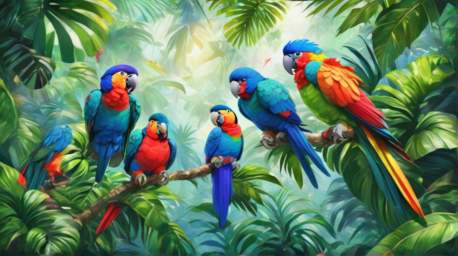

In [56]:
prompt = 'A vibrant tropical rainforest scene with colorful parrots perched on lush green branches.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(1334)

gen_image6 = pipe(prompt,
             generator=generator,
             height=728, # размер итоговой картинки
             width=1304, # размер итоговой картинки
             negative_prompt='No urban environments, no people, no mammals, no dull colors, no dry landscapes.',
             guidance_scale=9.2, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image6)

  0%|          | 0/20 [00:00<?, ?it/s]

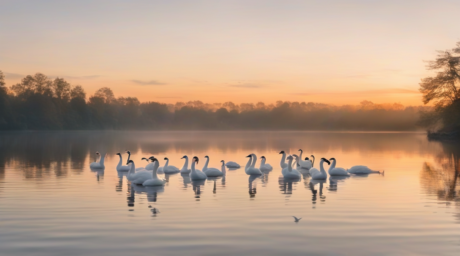

In [57]:
prompt = 'A serene lakeside view at dawn with a flock of swans gracefully gliding across the water.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(14334)

gen_image7 = pipe(prompt,
             generator=generator,
             height=720, # размер итоговой картинки
             width=1296, # размер итоговой картинки
             negative_prompt='No buildings, no boats, no people, no industrial elements, no harsh lighting.',
             guidance_scale=9.1, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image7)

  0%|          | 0/20 [00:00<?, ?it/s]

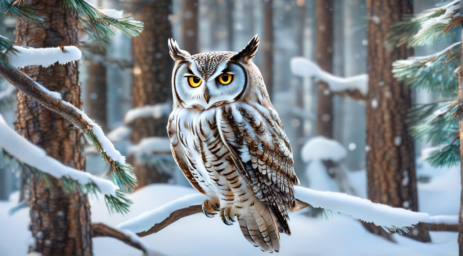

In [58]:
prompt = 'A snowy forest with a majestic owl silently observing from a frosty pine tree branch.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(14335)

gen_image8 = pipe(prompt,
             generator=generator,
             height=712, # размер итоговой картинки
             width=1288, # размер итоговой картинки
             negative_prompt='No bright sunlight, no summer foliage, no man-made objects, no other animals, no noisy backgrounds',
             guidance_scale=9.9, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image8)

  0%|          | 0/20 [00:00<?, ?it/s]

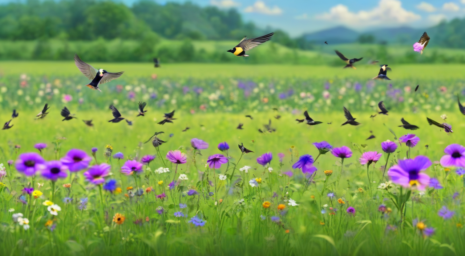

In [59]:
prompt = 'A wide-open field with a variety of songbirds flying and singing among blooming wildflowers.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(14325)

gen_image9 = pipe(prompt,
             generator=generator,
             height=704, # размер итоговой картинки
             width=1280, # размер итоговой картинки
             negative_prompt='No urban scenes, no machinery, no people, no autumn or winter scenery, no muted colors.',
             guidance_scale=9.8, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image9)

  0%|          | 0/20 [00:00<?, ?it/s]

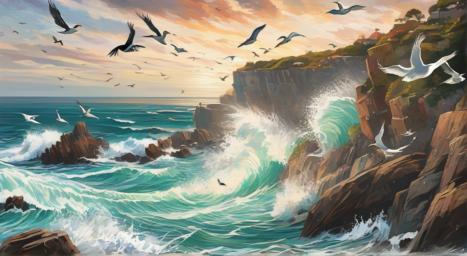

In [60]:
prompt = 'A coastal cliffside with seagulls soaring over the ocean and waves crashing against the rocks.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(325)

gen_image10 = pipe(prompt,
             generator=generator,
             height=696, # размер итоговой картинки
             width=1272, # размер итоговой картинки
             negative_prompt='No buildings, no human activity, no inland landscapes, no vehicles, no cloudy skies.',
             guidance_scale=9.7, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image10)

### Fish

  0%|          | 0/20 [00:00<?, ?it/s]

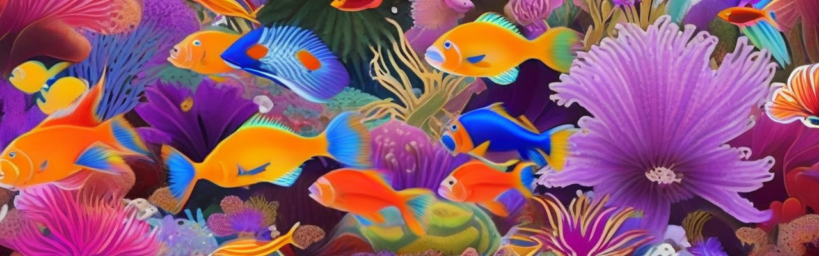

In [61]:
prompt = 'A vibrant coral reef teeming with colorful tropical fish swimming among the corals and sea anemones.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(125)

gen_image11 = pipe(prompt,
             generator=generator,
             height=400, # размер итоговой картинки
             width=1280, # размер итоговой картинки
             negative_prompt='No humans, no boats, no pollution, no dark or murky water, no damaged coral.',
             guidance_scale=9.6, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image11)

  0%|          | 0/20 [00:00<?, ?it/s]

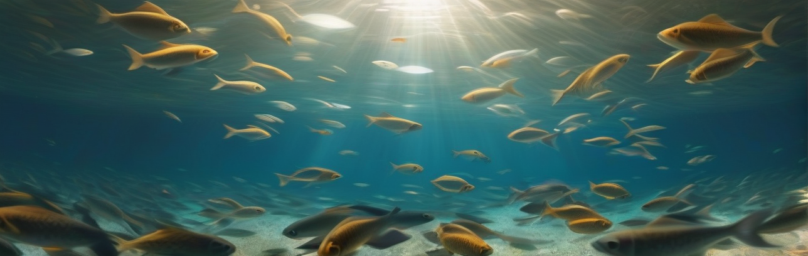

In [62]:
prompt = 'A serene freshwater lake with a school of shimmering fish swimming through the clear, calm waters.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(127)

gen_image12 = pipe(prompt,
             generator=generator,
             height=408, # размер итоговой картинки
             width=1288, # размер итоговой картинки
             negative_prompt='No urban structures, no people, no algae blooms, no muddy water, no fishing equipment.',
             guidance_scale=8.6, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image12)

  0%|          | 0/20 [00:00<?, ?it/s]

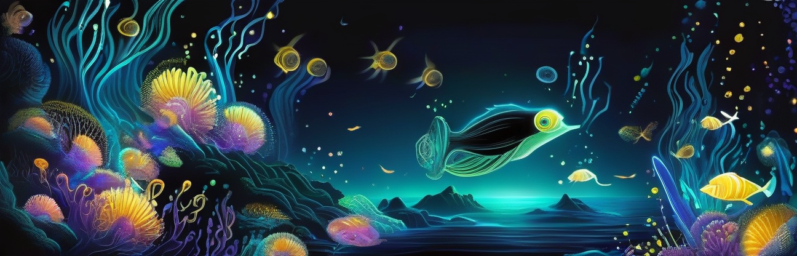

In [63]:
prompt = 'A deep ocean scene with bioluminescent fish illuminating the dark waters with their glowing bodies.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(137)

gen_image13 = pipe(prompt,
             generator=generator,
             height=416, # размер итоговой картинки
             width=1296, # размер итоговой картинки
             negative_prompt='No daylight, no shallow water, no man-made objects, no surface reflections, no non-glowing fish.',
             guidance_scale=8.7, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image13)

  0%|          | 0/20 [00:00<?, ?it/s]

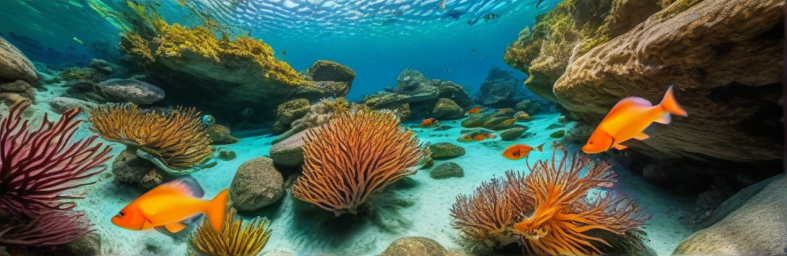

In [64]:
prompt = 'A crystal-clear tropical lagoon where colorful fish dart among the swaying seaweed and underwater rocks.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(337)

gen_image14 = pipe(prompt,
             generator=generator,
             height=424, # размер итоговой картинки
             width=1304, # размер итоговой картинки
             negative_prompt='No boats, no humans, no cloudy water, no pollution, no non-tropical fish.',
             guidance_scale=8.8, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image14)

  0%|          | 0/20 [00:00<?, ?it/s]

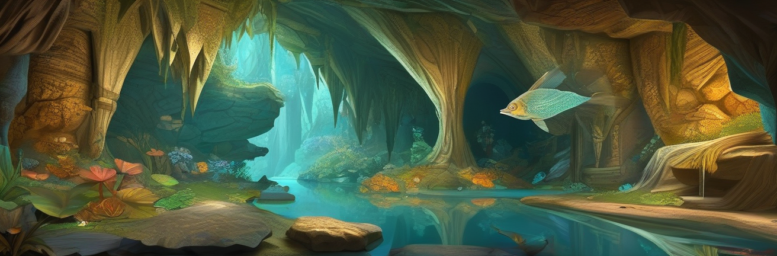

In [65]:
prompt = 'An intricate underwater cave system with exotic big fish in the foreground exploring the crevices and hidden chambers.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(447)

gen_image15 = pipe(prompt,
             generator=generator,
             height=432, # размер итоговой картинки
             width=1312, # размер итоговой картинки
             negative_prompt='No divers, no artificial light, no flat surfaces, no open ocean, no non-fish creatures.',
             guidance_scale=8.9, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image15)

### Mountains

  0%|          | 0/20 [00:00<?, ?it/s]

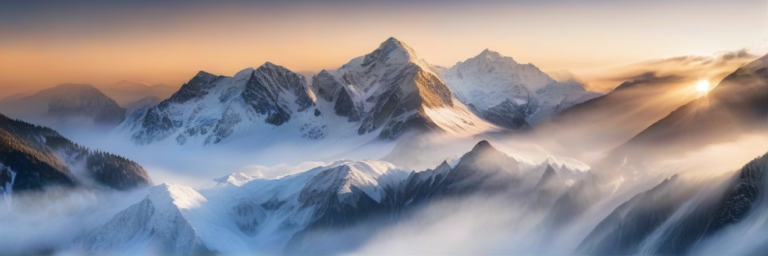

In [66]:
prompt = 'A majestic mountain range at sunrise with snow-capped peaks and a valley covered in a blanket of mist.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(547)

gen_image16 = pipe(prompt,
             generator=generator,
             height=440, # размер итоговой картинки
             width=1320, # размер итоговой картинки
             negative_prompt='No buildings, no roads, no people, no clear skies, no flat landscapes.',
             guidance_scale=8.1, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image16)

  0%|          | 0/20 [00:00<?, ?it/s]

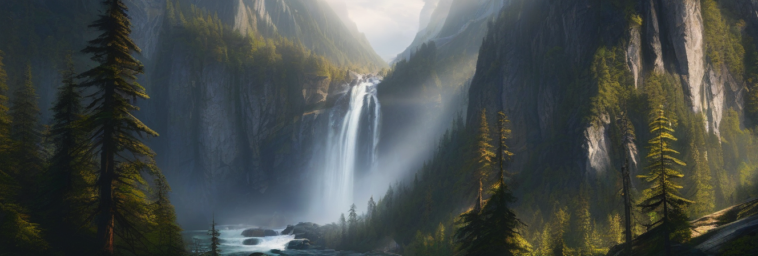

In [67]:
prompt = 'A dramatic mountain landscape with rugged cliffs, cascading waterfalls, and a dense forest at the base.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(557)

gen_image17 = pipe(prompt,
             generator=generator,
             height=448, # размер итоговой картинки
             width=1328, # размер итоговой картинки
             negative_prompt='No urban elements, no animals, no smooth surfaces, no dull colors, no dry terrain.',
             guidance_scale=8.2, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image17)

  0%|          | 0/20 [00:00<?, ?it/s]

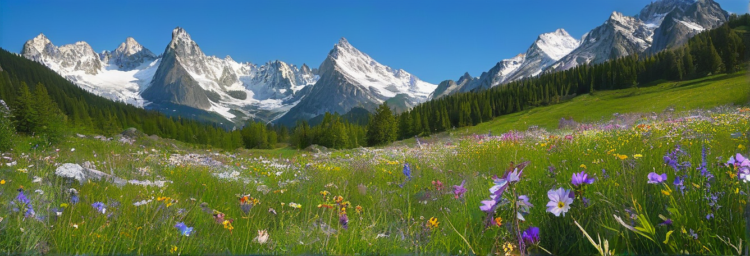

In [68]:
prompt = 'A peaceful alpine meadow with wildflowers in bloom, framed by towering mountains and a clear blue sky.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(567)

gen_image18 = pipe(prompt,
             generator=generator,
             height=456, # размер итоговой картинки
             width=1336, # размер итоговой картинки
             negative_prompt='No man-made structures, no crowds, no vehicles, no dark clouds, no barren ground.',
             guidance_scale=8.2, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image18)

  0%|          | 0/20 [00:00<?, ?it/s]

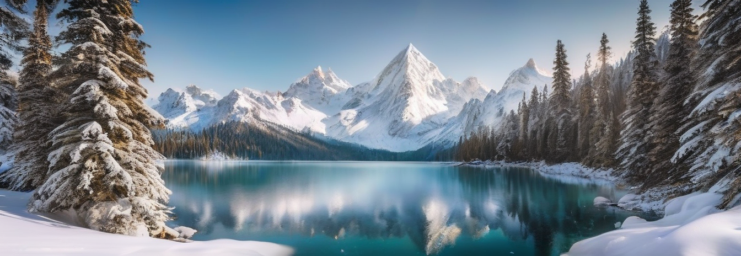

In [69]:
prompt = 'A stunning winter mountain scene with evergreen trees covered in snow and a crystal-clear frozen lake.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(667)

gen_image19 = pipe(prompt,
             generator=generator,
             height=464, # размер итоговой картинки
             width=1344, # размер итоговой картинки
             negative_prompt='No summer foliage, no humans, no thawed water, no mud, no modern buildings.',
             guidance_scale=8.3, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image19)

  0%|          | 0/20 [00:00<?, ?it/s]

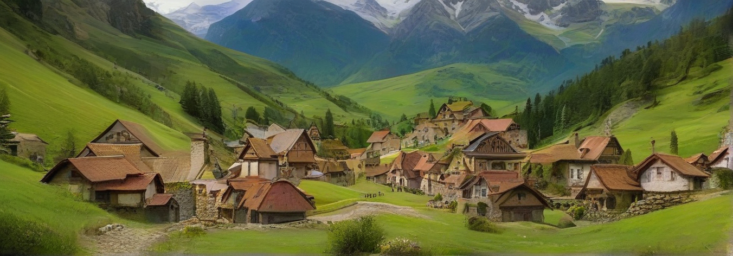

In [70]:
prompt = 'A picturesque mountain village nestled in a valley, surrounded by towering peaks and lush green hills.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(666)

gen_image20 = pipe(prompt,
             generator=generator,
             height=472, # размер итоговой картинки
             width=1352, # размер итоговой картинки
             negative_prompt='No modern skyscrapers, no highways, no pollution, no industrial areas, no deforested regions.',
             guidance_scale=7.4, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image20)

### Machines

  0%|          | 0/20 [00:00<?, ?it/s]

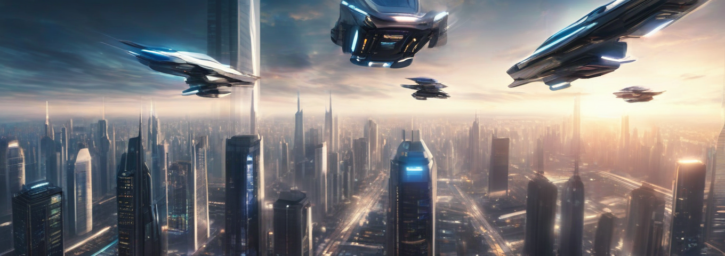

In [71]:
prompt = 'A futuristic cityscape featuring advanced flying vehicles zooming between sleek skyscrapers under a glowing sky.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(676)

gen_image21 = pipe(prompt,
             generator=generator,
             height=480, # размер итоговой картинки
             width=1360, # размер итоговой картинки
             negative_prompt='No nature elements, no animals, no ancient architecture, no broken structures, no dull colors.',
             guidance_scale=7.3, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image21)

  0%|          | 0/20 [00:00<?, ?it/s]

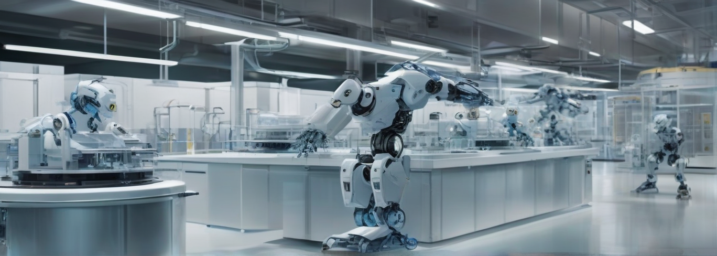

In [72]:
prompt = 'A high-tech laboratory with sophisticated robots performing precise tasks on cutting-edge scientific equipment.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(677)

gen_image22 = pipe(prompt,
             generator=generator,
             height=488, # размер итоговой картинки
             width=1368, # размер итоговой картинки
             negative_prompt='No people, no clutter, no traditional tools, no nature elements, no low-tech devices.',
             guidance_scale=7.2, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image22)

  0%|          | 0/20 [00:00<?, ?it/s]

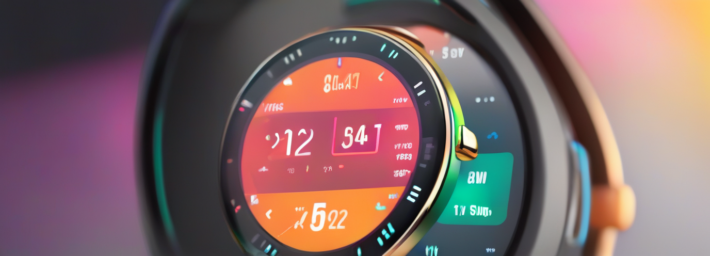

In [73]:
prompt = 'A detailed close-up of a modern smartwatch displaying various health metrics and notifications in vibrant colors.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(877)

gen_image23 = pipe(prompt,
             generator=generator,
             height=496, # размер итоговой картинки
             width=1376, # размер итоговой картинки
             negative_prompt='No outdated technology, no human hands, no plain backgrounds, no monochrome screens, no cracks or damage',
             guidance_scale=7.1, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image23)

  0%|          | 0/20 [00:00<?, ?it/s]

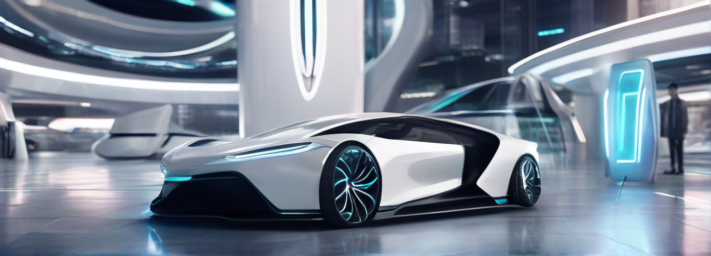

In [74]:
prompt = 'A sleek electric car charging at a futuristic station, surrounded by other innovative transportation technologies.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(887)

gen_image24 = pipe(prompt,
             generator=generator,
             height=504, # размер итоговой картинки
             width=1400, # размер итоговой картинки
             negative_prompt='No fossil fuel vehicles, no rustic elements, no nature scenes, no busy crowds, no broken equipment.',
             guidance_scale=7.6, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image24)

  0%|          | 0/20 [00:00<?, ?it/s]

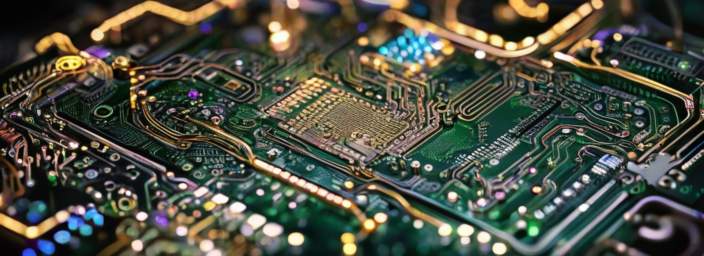

In [75]:
prompt = 'An intricate circuit board with glowing pathways and components, showcasing the complexity of modern electronics.'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(888)

gen_image25 = pipe(prompt,
             generator=generator,
             height=512, # размер итоговой картинки
             width=1408, # размер итоговой картинки
             negative_prompt='No nature, no human touch, no low-resolution elements, no outdated components, no dull colors.',
             guidance_scale=7.7, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image25)

## Embeddings

In [48]:
from PIL import Image
import requests
from transformers import CLIPProcessor, CLIPModel
from sklearn.cluster import KMeans
import numpy as np

In [47]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

/home/jovyan/akimov_de/venv/lib/python3.9/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [77]:
def extract_embeddings(images):
    embeddings = []
    for image in images:
        if isinstance(image, np.ndarray):
            image = Image.fromarray(image)  # Конвертировать NumPy массив в PIL Image
        inputs = processor(images=image, return_tensors="pt")
        with torch.no_grad():
            outputs = model.get_image_features(**inputs)
        embeddings.append(outputs.cpu().numpy())
    return np.vstack(embeddings)

# Пример использования с изображениями, хранящимися в памяти
# images - список изображений в формате PIL Image или NumPy массивов
images = [gen_image1, gen_image2, gen_image3, gen_image4, gen_image5, gen_image6, gen_image7, gen_image8, gen_image9, gen_image10, gen_image11, gen_image12, gen_image13, gen_image14, gen_image15, gen_image16, gen_image17, gen_image18, gen_image19, gen_image20, gen_image21, gen_image22, gen_image23, gen_image24, gen_image25]  # Подставьте свои изображения
embeddings = extract_embeddings(images)

In [78]:
from sklearn.preprocessing import StandardScaler

# Предварительная обработка эмбеддингов
scaler = StandardScaler()
embeddings_scaled = scaler.fit_transform(embeddings)

# Определение количества классов
num_classes = 5  # Например, 5 классов
kmeans = KMeans(n_clusters=num_classes, random_state=42)
kmeans.fit(embeddings_scaled)
labels = kmeans.labels_

# Вывод меток классов для изображений
for idx, label in enumerate(labels):
    print(f"Image {idx+1}, Class: {label}")

Image 1, Class: 4
Image 2, Class: 1
Image 3, Class: 2
Image 4, Class: 4
Image 5, Class: 2
Image 6, Class: 0
Image 7, Class: 4
Image 8, Class: 4
Image 9, Class: 4
Image 10, Class: 0
Image 11, Class: 0
Image 12, Class: 0
Image 13, Class: 2
Image 14, Class: 0
Image 15, Class: 2
Image 16, Class: 1
Image 17, Class: 1
Image 18, Class: 1
Image 19, Class: 1
Image 20, Class: 1
Image 21, Class: 3
Image 22, Class: 3
Image 23, Class: 4
Image 24, Class: 3
Image 25, Class: 4


In [79]:
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt


In [80]:
# Список изображений
images = [gen_image1, gen_image2, gen_image3, gen_image4, gen_image5, 
          gen_image6, gen_image7, gen_image8, gen_image9, gen_image10, 
          gen_image11, gen_image12, gen_image13, gen_image14, gen_image15,
          gen_image16, gen_image17, gen_image18, gen_image19, gen_image20, 
          gen_image21, gen_image22, gen_image23, gen_image24, gen_image25]

# Реальные метки классов
true_labels = [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4]

In [81]:
embeddings = extract_embeddings(images)

# Предварительная обработка эмбеддингов
scaler = StandardScaler()
embeddings_scaled = scaler.fit_transform(embeddings)

# Определение количества классов
num_classes = 5  # У нас 5 классов
kmeans = KMeans(n_clusters=num_classes, random_state=42)
kmeans.fit(embeddings_scaled)
predicted_labels = kmeans.labels_

# Оценка качества кластеризации
ari_score = adjusted_rand_score(true_labels, predicted_labels)
print(f"Adjusted Rand Index (ARI): {ari_score:.2f}")


Adjusted Rand Index (ARI): 0.34


In [83]:
from sklearn.decomposition import PCA

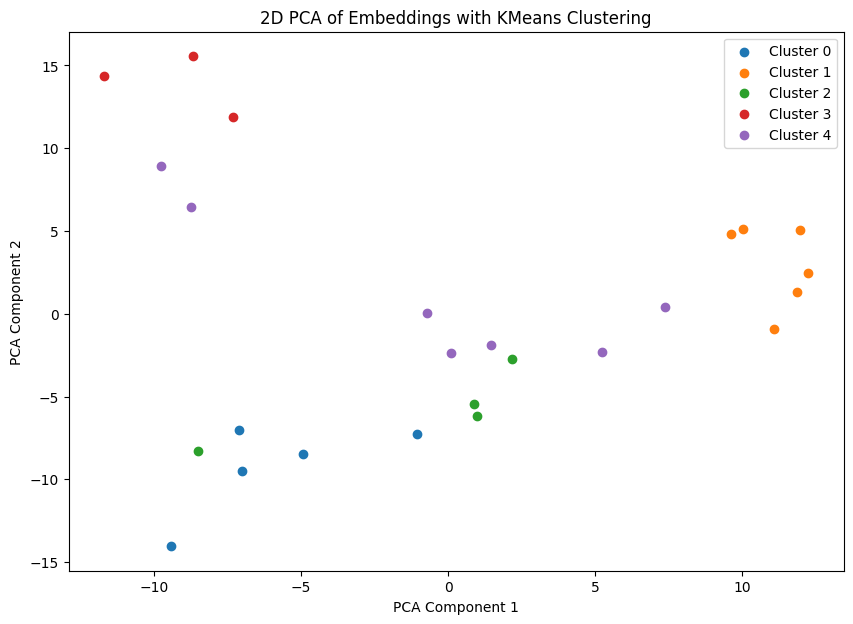

In [84]:
# Визуализация эмбеддингов с цветовой кодировкой по предсказанным меткам
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings_scaled)

plt.figure(figsize=(10, 7))
for i in range(num_classes):
    indices = [j for j, x in enumerate(predicted_labels) if x == i]
    plt.scatter(embeddings_2d[indices, 0], embeddings_2d[indices, 1], label=f'Cluster {i}')
plt.legend()
plt.title('2D PCA of Embeddings with KMeans Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()